In [27]:
import os
import random
import sys
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, Dataset
from torchvision.datasets import CIFAR10

from torchvision import transforms, datasets, models
import lpips  # pip install lpips

import cv2
import numpy as np
import math
import matplotlib.pyplot as plt



In [17]:
data_dir = './data'

# Load CIFAR-10 dataset
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Upscale CIFAR-10 for SIFT to work properly
    transforms.ToTensor()
])

train_set = datasets.CIFAR10(root=data_dir, train=True, download=True, transform=transform)
test_set = datasets.CIFAR10(root=data_dir, train=False, download=True, transform=transform)

In [23]:
import argparse
import lpips

use_gpu = True

## Initializing the model
loss_fn = lpips.LPIPS(net='alex',version='0.1')

if(use_gpu):
    loss_fn.cuda()
    
def lpips_distance(img1, img2):
    if(use_gpu):
        tensor_img0 = img1.to(torch.device("cuda"))
        tensor_img1 = img2.cuda(torch.device("cuda" ))
    
    tensor_img0 = tensor_img0.unsqueeze(0) * 2 - 1
    tensor_img1 = tensor_img1.unsqueeze(0) * 2 - 1
    
    # Compute distance
    with torch.no_grad():
        dist01 = loss_fn.forward(tensor_img0, tensor_img1)
    
    return dist01.item() 


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/home/msimoni/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/msimoni/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/msimoni/.local/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


In [8]:
def tensor_to_cv2(img_tensor):
    # Convert from [0,1] to [0,255] and change to numpy array
    img = img_tensor.permute(1, 2, 0).numpy() * 255
    img = img.astype(np.uint8)
    return img

# Function to calculate SIFT distance between two images
def sift_distance(img1_tensor, img2_tensor):
    sift = cv2.SIFT_create()

    # Convert to OpenCV format
    img1 = tensor_to_cv2(img1_tensor)
    img2 = tensor_to_cv2(img2_tensor)

    # Convert to grayscale for SIFT
    gray1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

    # Find keypoints and descriptors
    kp1, des1 = sift.detectAndCompute(gray1, None)
    kp2, des2 = sift.detectAndCompute(gray2, None)

    if des1 is None or des2 is None:
        print("No SIFT features found in one or both images.")
        return float('inf')  # Infinite distance if no features found

    # Match features using FLANN
    index_params = dict(algorithm=1, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    matches = flann.knnMatch(des1, des2, k=2)

    # Apply Lowe's ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)

    if len(good_matches) == 0:
        return float('inf')  # No good matches found

    # Calculate the average distance of the good matches
    avg_distance = np.mean([m.distance for m in good_matches])
    return avg_distance

In [16]:

def get_transformations(image_tensor):
    _, height, width = image_tensor.shape
    transformations = {
        "horizontal_flip": transforms.RandomHorizontalFlip(p=1.0),
        "vertical_flip": transforms.RandomVerticalFlip(p=1.0),
        "rotation": transforms.RandomRotation(degrees=random.randint(30,300)),
        "color_enhancement": transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.3),
        # Assuming the images are at least 224x224; adjust as necessary.
        "random_crop": transforms.Compose([transforms.RandomCrop((random.randint(height // 3, 3 * height // 4 ), random.randint(width // 3, 3 * width // 4))), transforms.Resize((height,width))]),
        "blur": transforms.GaussianBlur(kernel_size=(7, 25),sigma=(9, 11))
    }
    return transformations



In [18]:
subset = []
original_images = []

# get 100 images random
for i in range(0, 100):
    subset.append(train_set[random.randint(0,len(train_set)-1)][0])

# get 6 images random
for i in range(0, 10):
    img = train_set[random.randint(0,len(train_set)-1)][0]

    original_images.append(img)

    transformations = get_transformations(img)
    for t_name, transform in transformations.items():
        transformed = transform(img)
        subset.append(transformed)

print("size subset: ", len(subset))

size subset:  160


In [25]:
import math
def get_neighbours(image, num_neigh):
    lpips_neigh = [(None,math.inf)]*num_neigh
    sift_neigh = [(None,math.inf)]*num_neigh
    
    for testing_img in subset:
        tmp_dist = lpips_distance(image,testing_img)
        i = 0
        while(i < num_neigh and tmp_dist < lpips_neigh[i][1]):
            if(i != 0):
                lpips_neigh[i-1] = lpips_neigh[i]
            i += 1
        if i != 0:
            lpips_neigh[i-1] = (testing_img,tmp_dist)
            
        
        tmp_dist = sift_distance(image,testing_img)
        i = 0
        while(i < num_neigh and tmp_dist < sift_neigh[i][1]):
            if(i != 0):
                sift_neigh[i-1] = sift_neigh[i]
            i += 1
        if i != 0:
            sift_neigh[i-1] = (testing_img,tmp_dist)

    return (lpips_neigh, sift_neigh)

In [29]:
def show_plot(orig_img, neighbours, num_neigh, num_plot, dist_type):
    fig = plt.figure(num_plot)
    fig.set_size_inches(12, 12)

    # Convert orig_img if it's a tensor
    if isinstance(orig_img, torch.Tensor):
        orig_img = orig_img.permute(1, 2, 0).numpy()

    fig.add_subplot(5, 5, 1)
    plt.imshow(orig_img)
    plt.title(dist_type)
    plt.xticks([]) 
    plt.yticks([])

    for i, (img, dist) in enumerate(neighbours):
        if img is None:
            img = orig_img
        else:
            # Convert image if it's a tensor
            if isinstance(img, torch.Tensor):
                img = img.permute(1, 2, 0).numpy()

        fig.add_subplot(5, 5, i + 6)
        plt.imshow(img)
        plt.title("%.3f" % dist)
        plt.xticks([])
        plt.yticks([])

    plt.show()

No SIFT features found in one or both images.


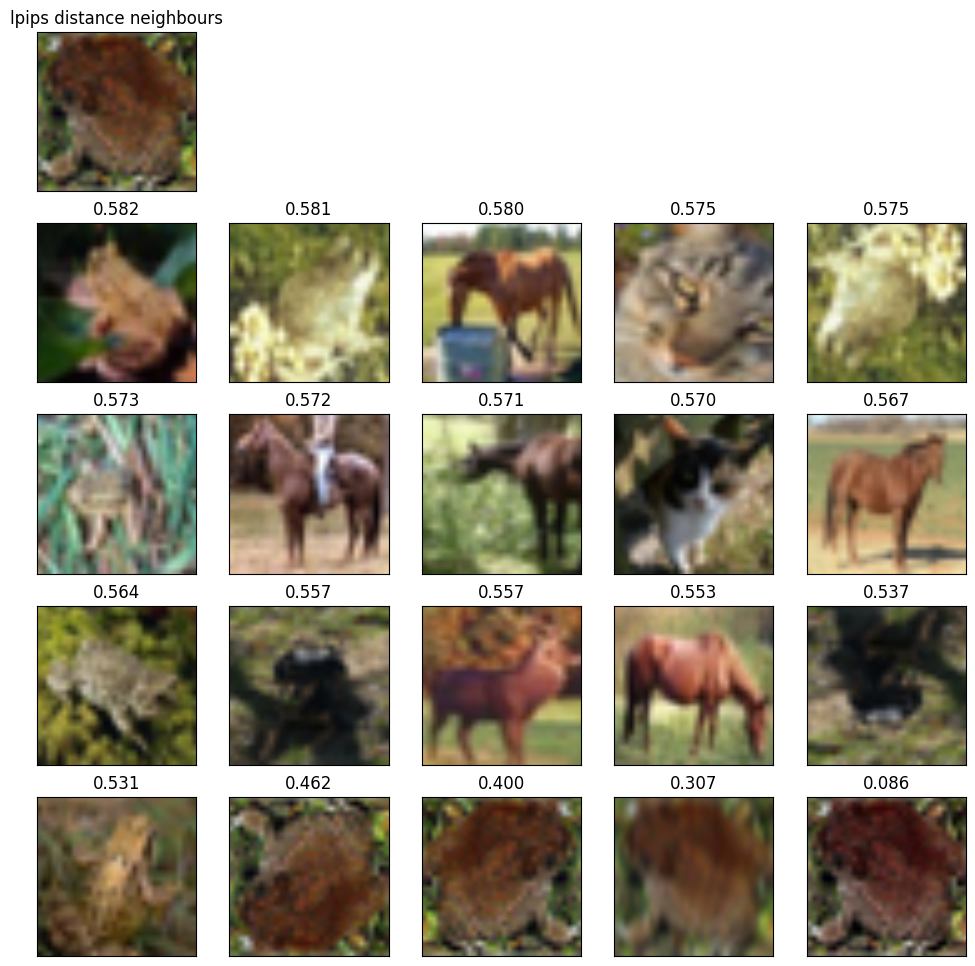

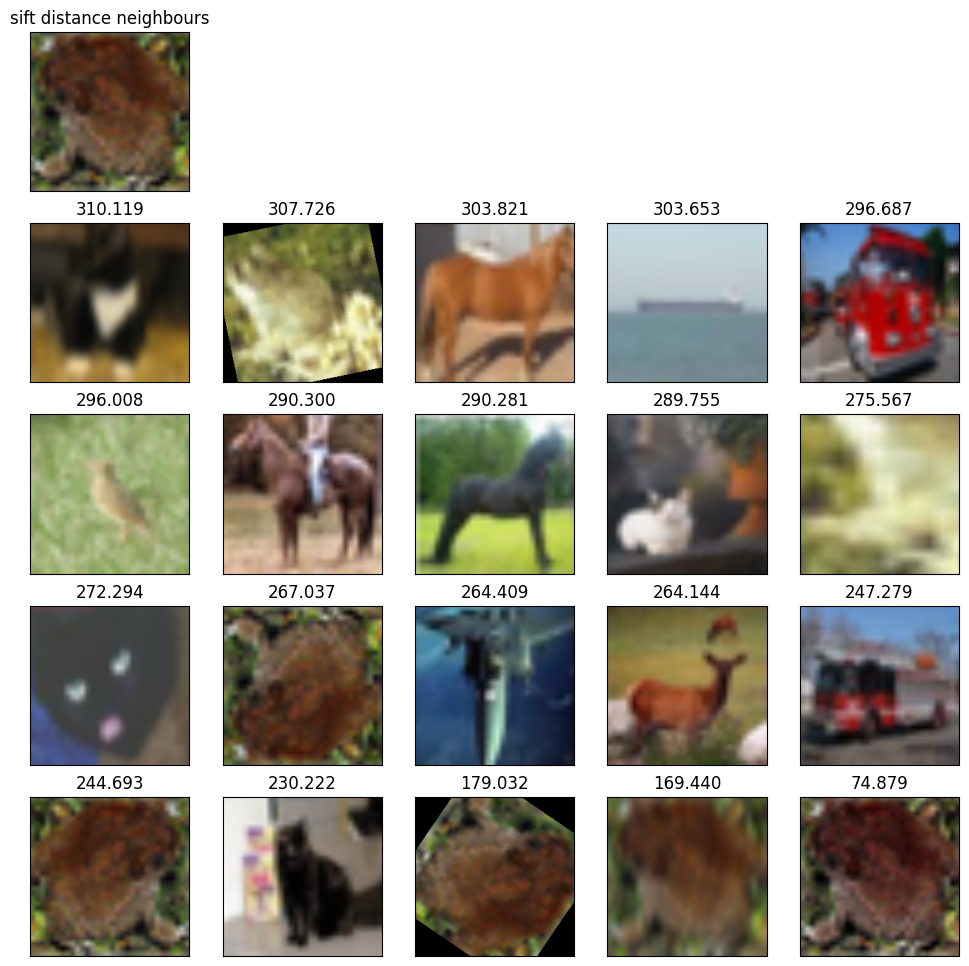

No SIFT features found in one or both images.


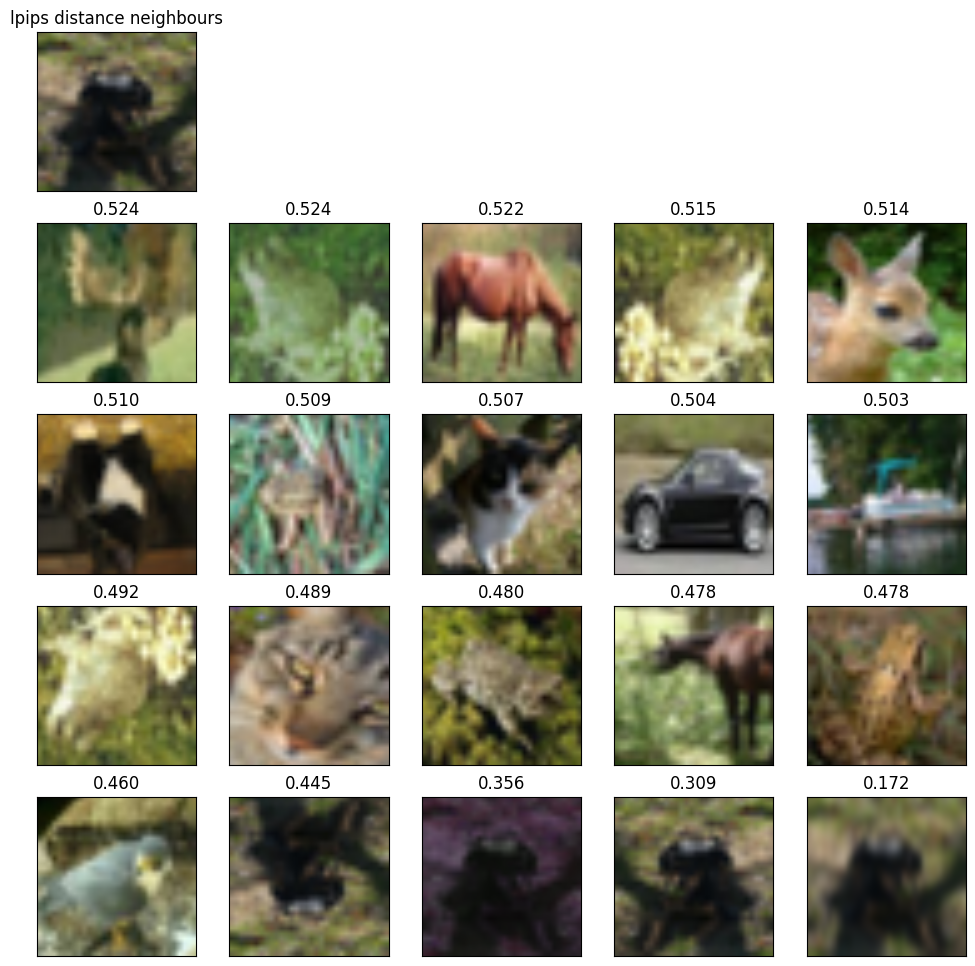

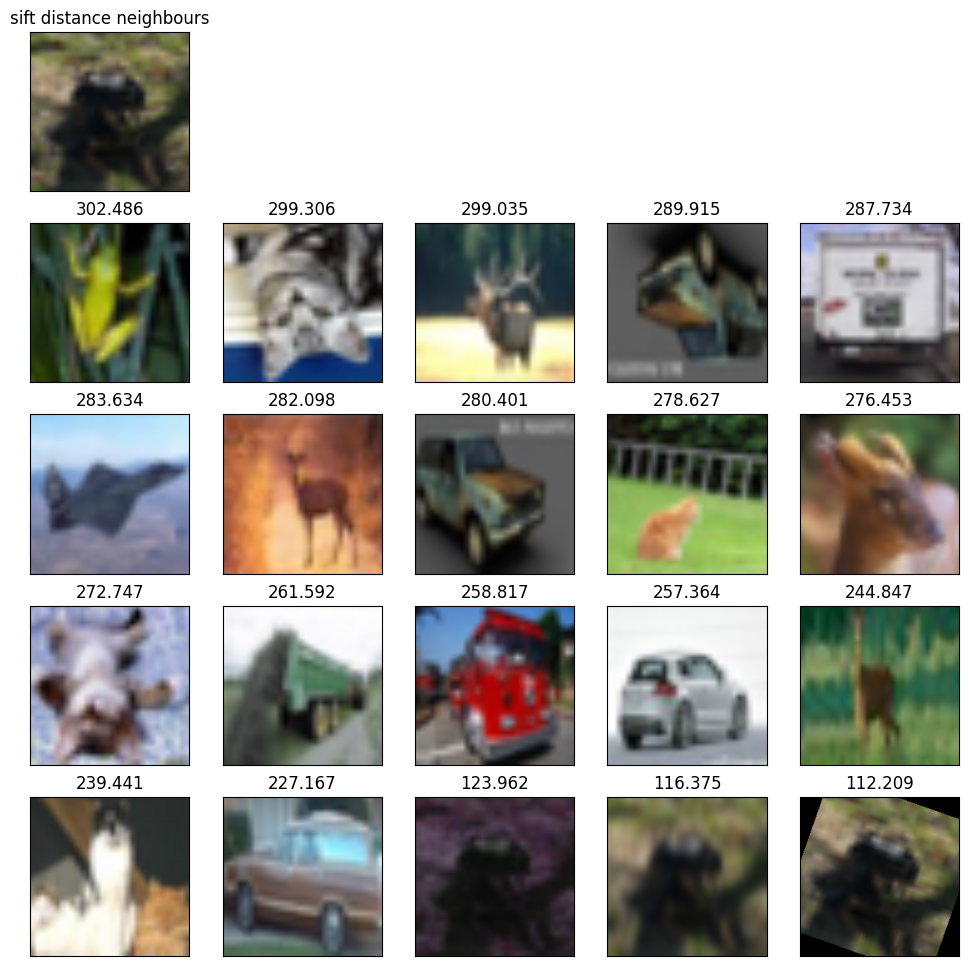

No SIFT features found in one or both images.


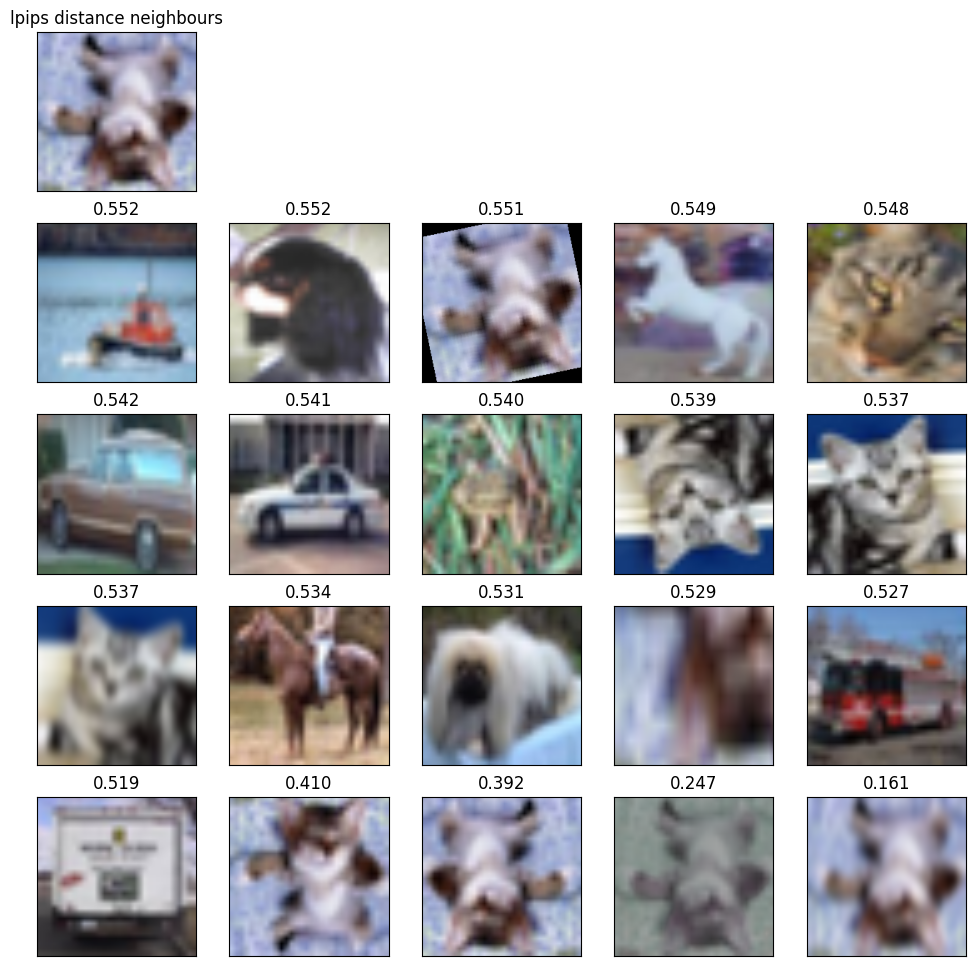

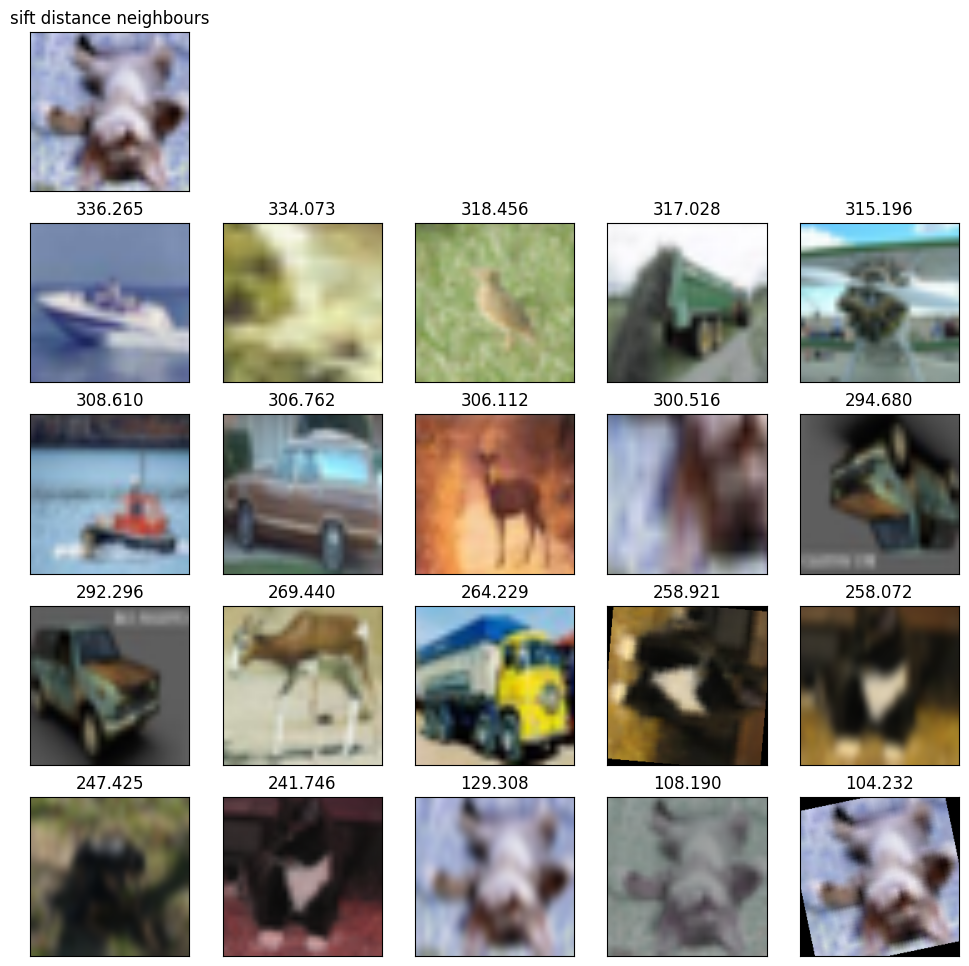

No SIFT features found in one or both images.


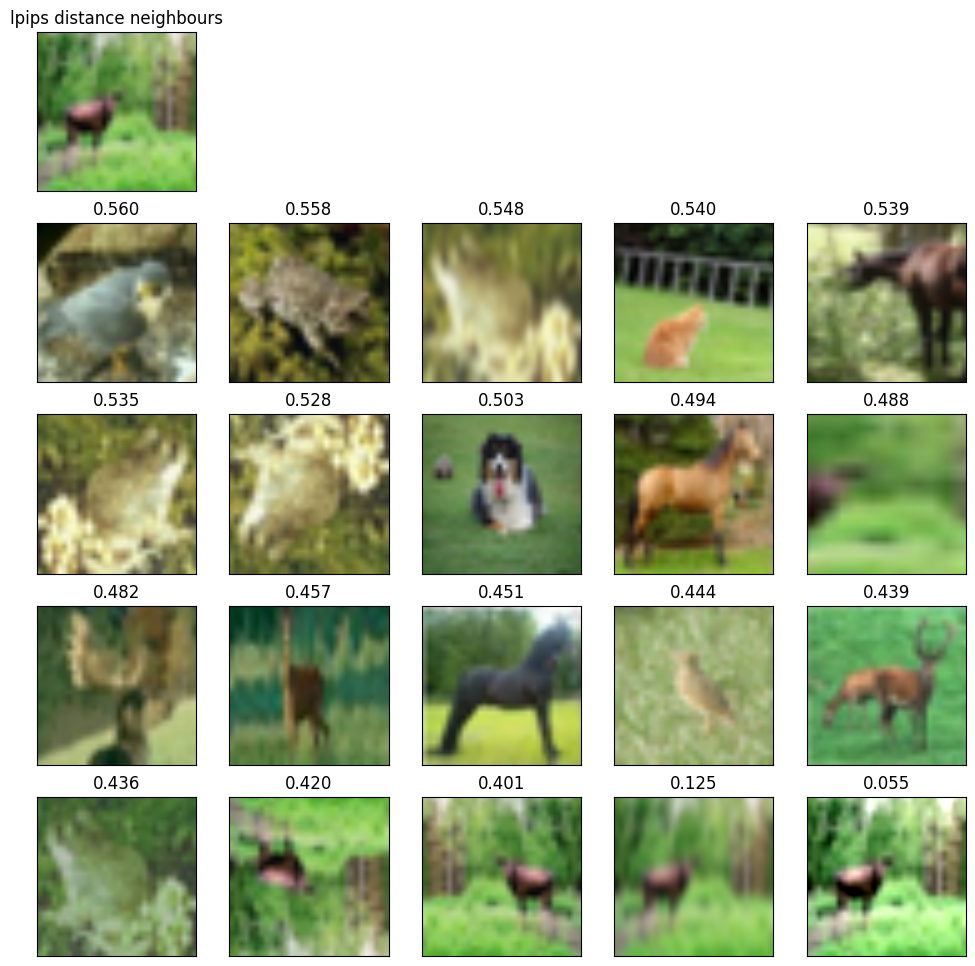

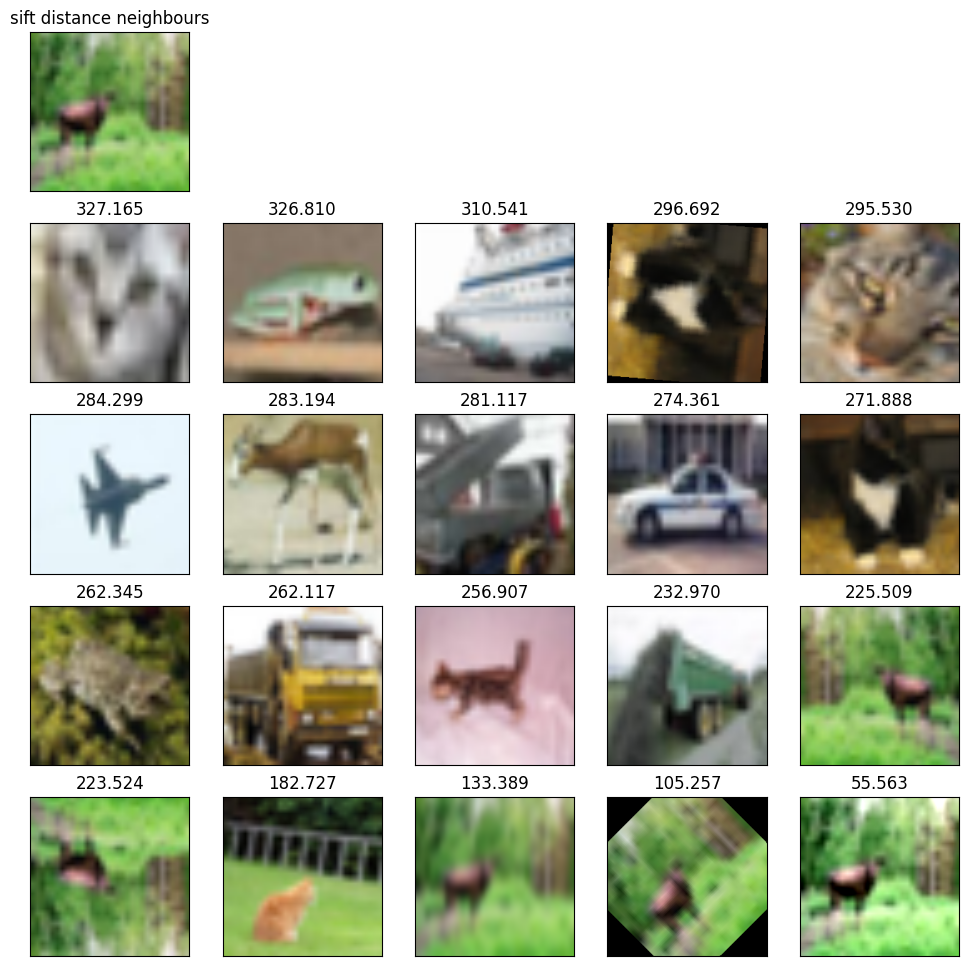

No SIFT features found in one or both images.


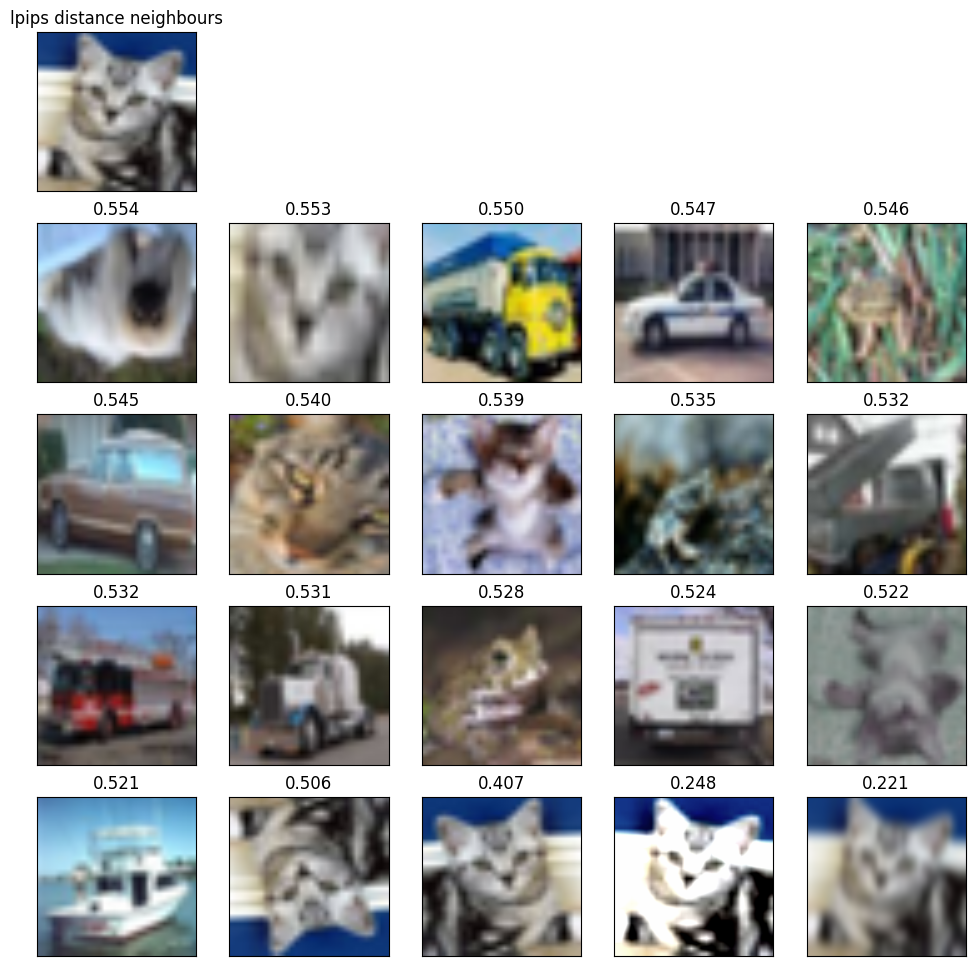

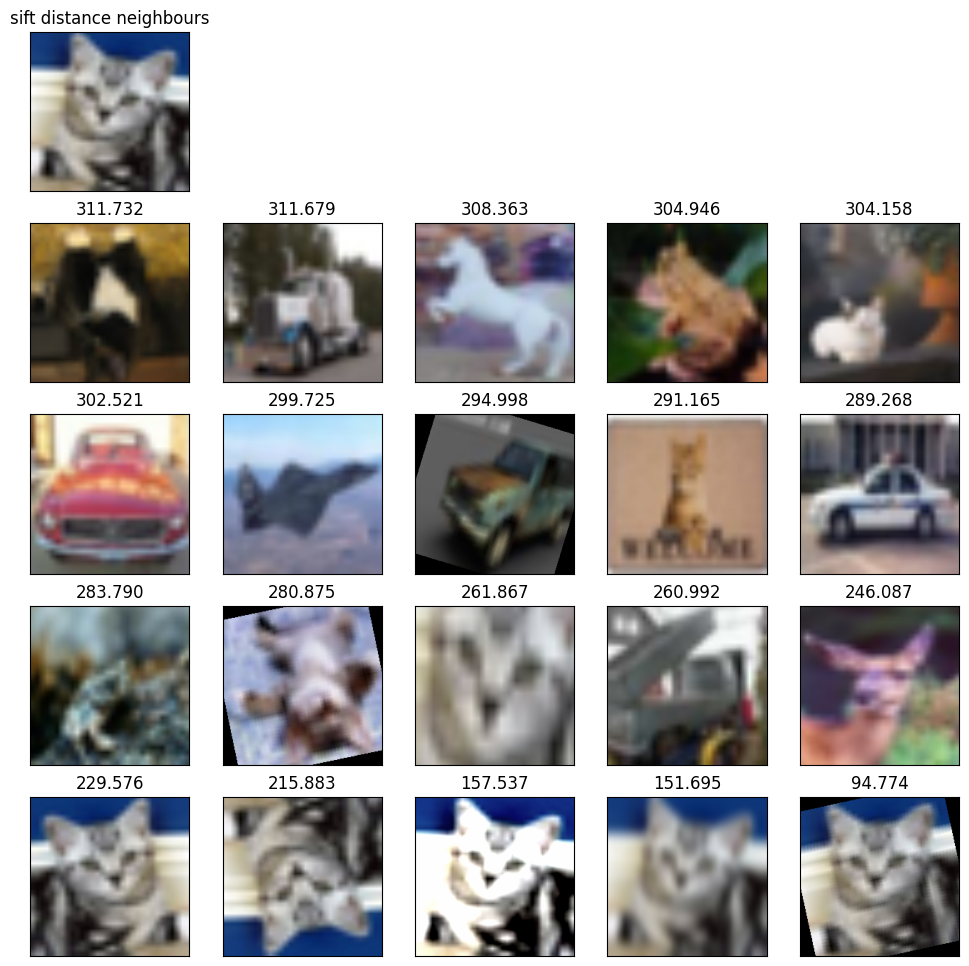

No SIFT features found in one or both images.


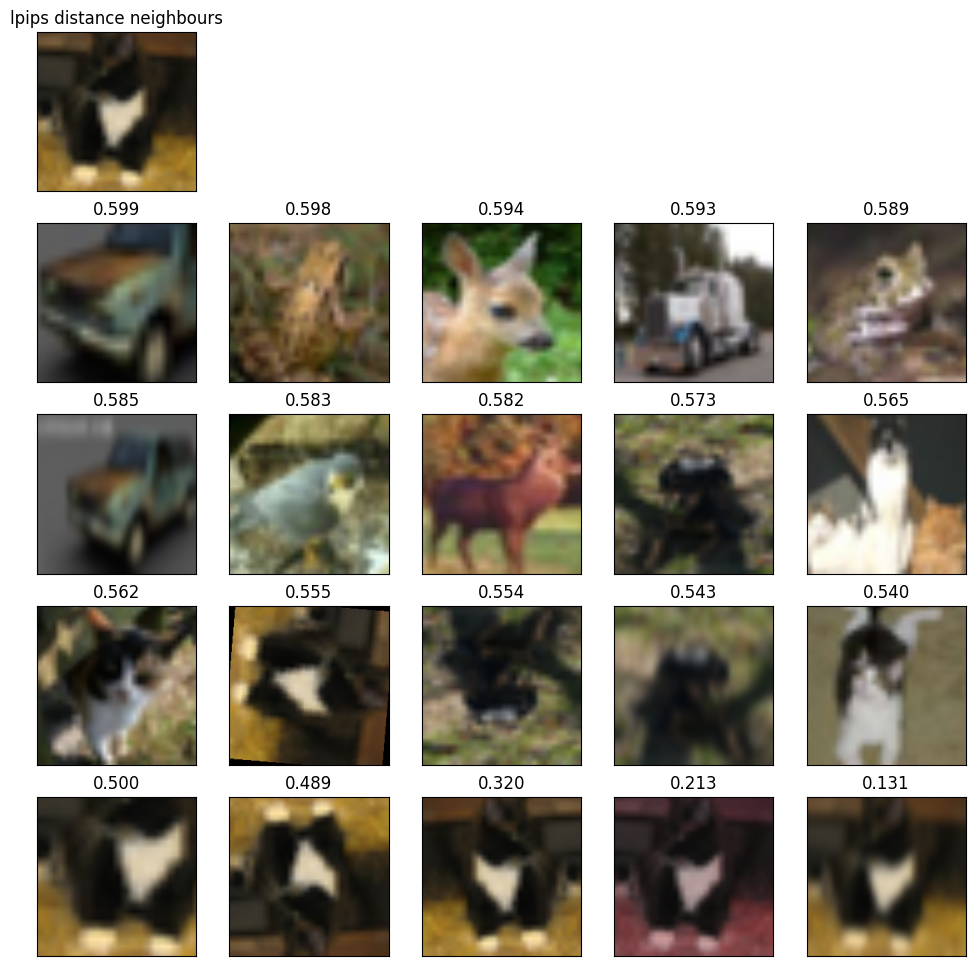

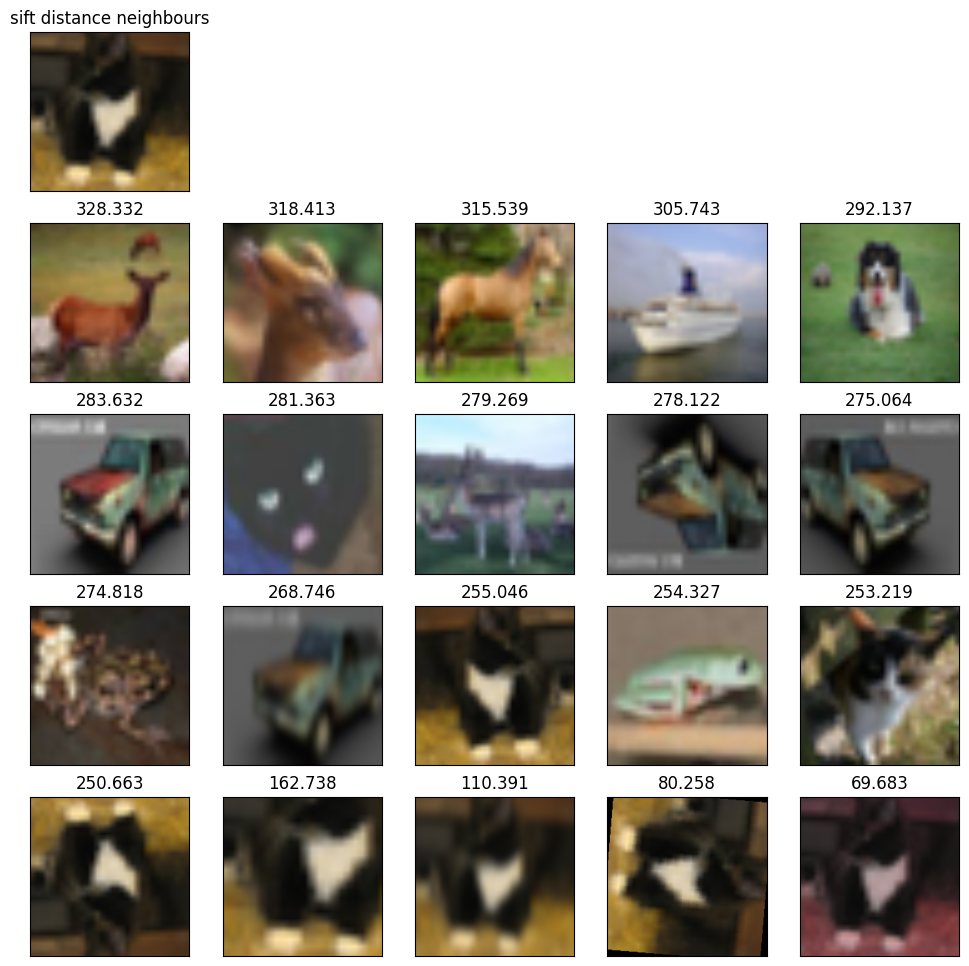

No SIFT features found in one or both images.


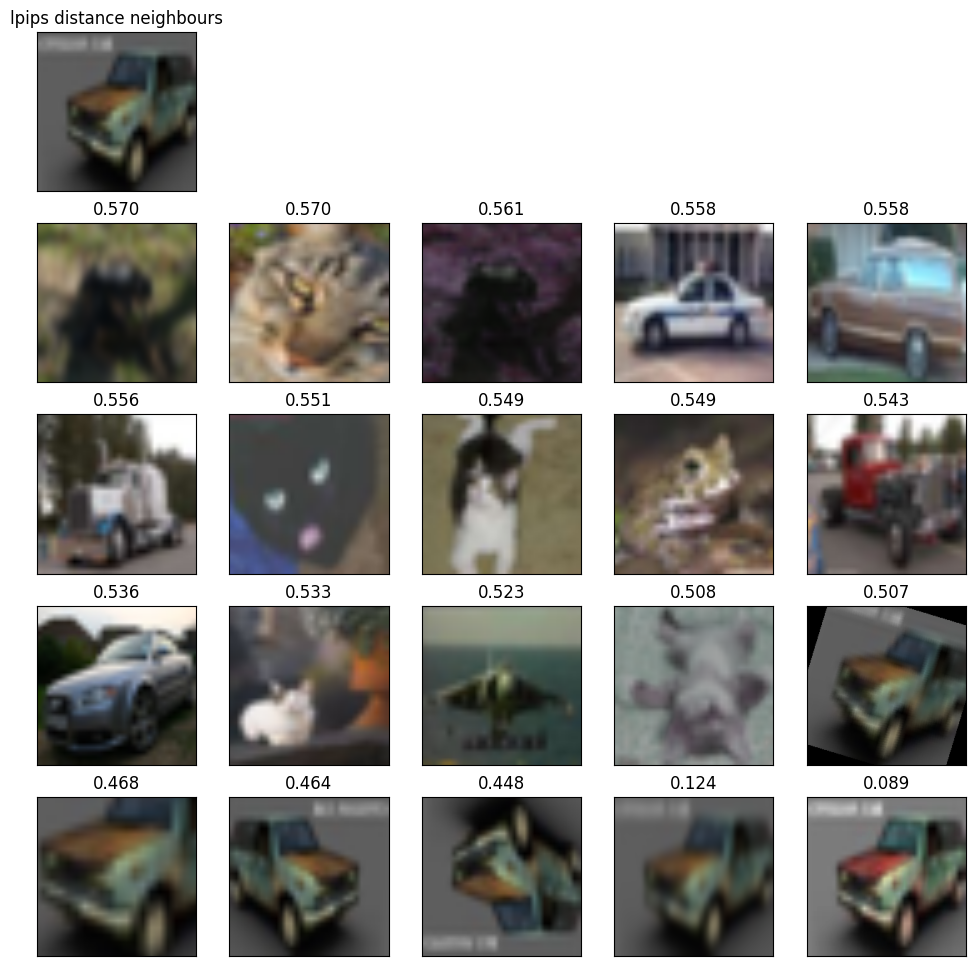

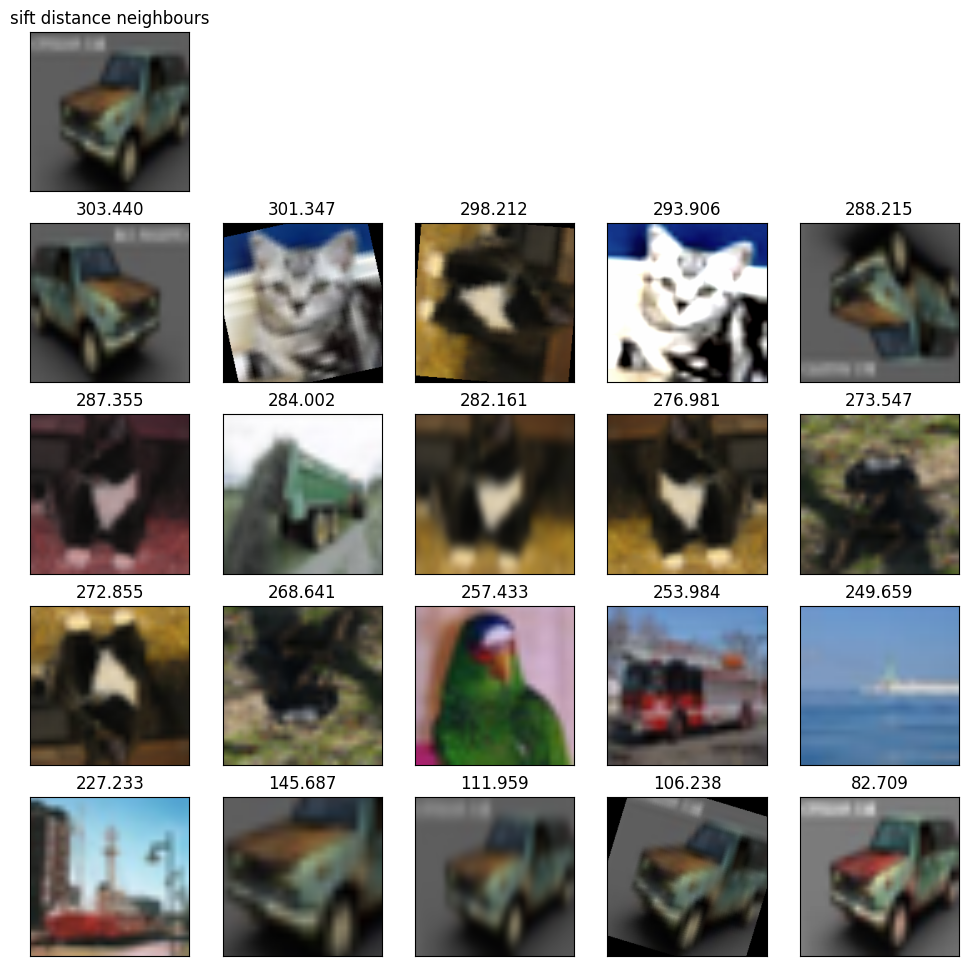

No SIFT features found in one or both images.


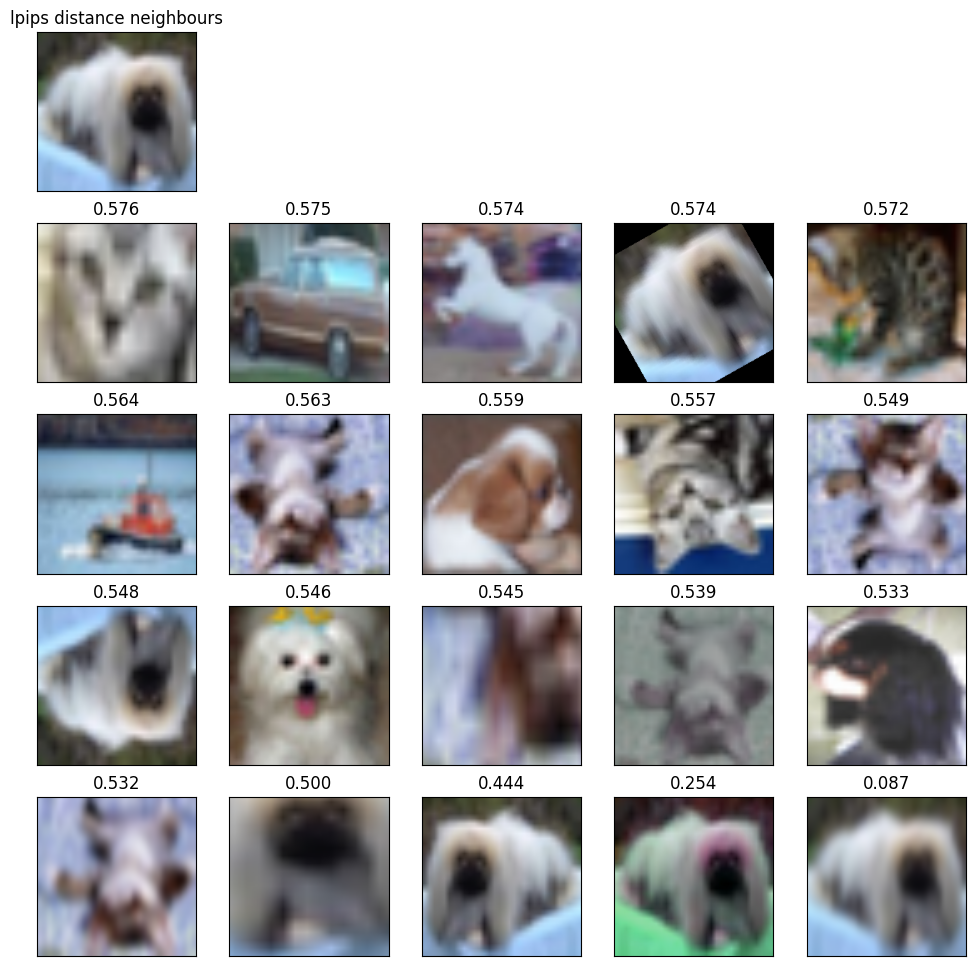

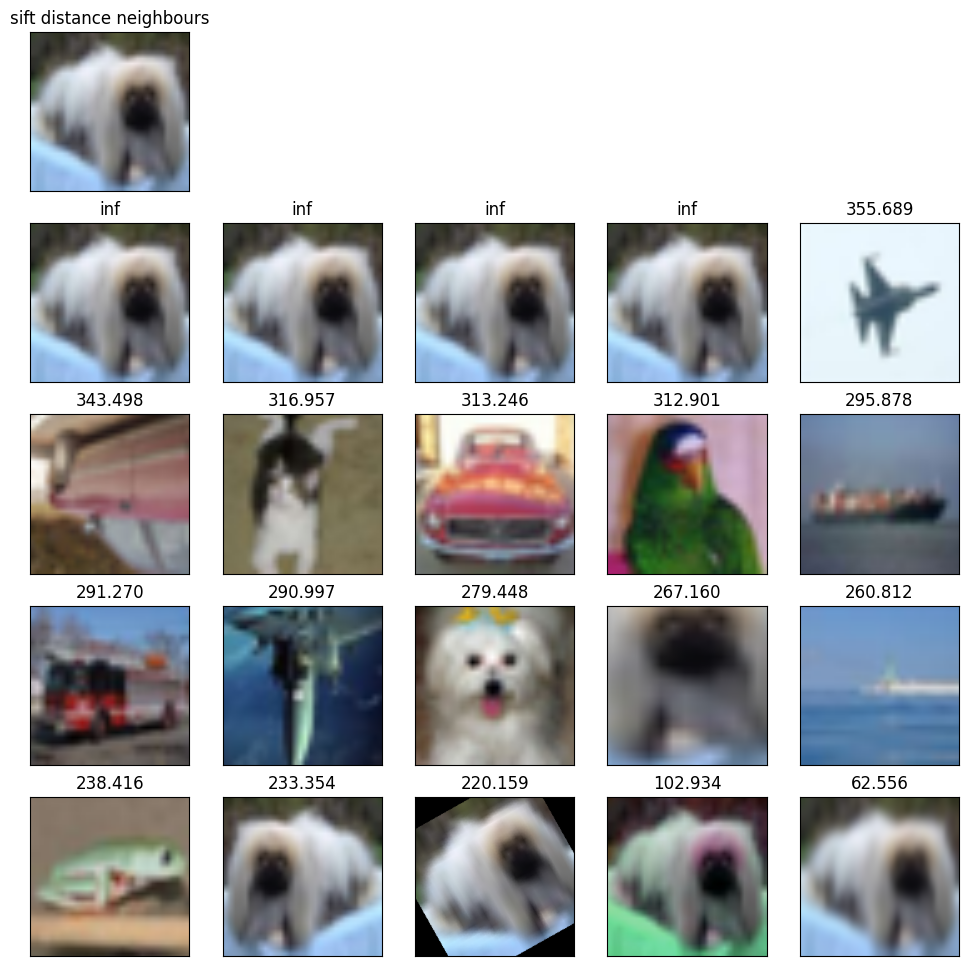

No SIFT features found in one or both images.


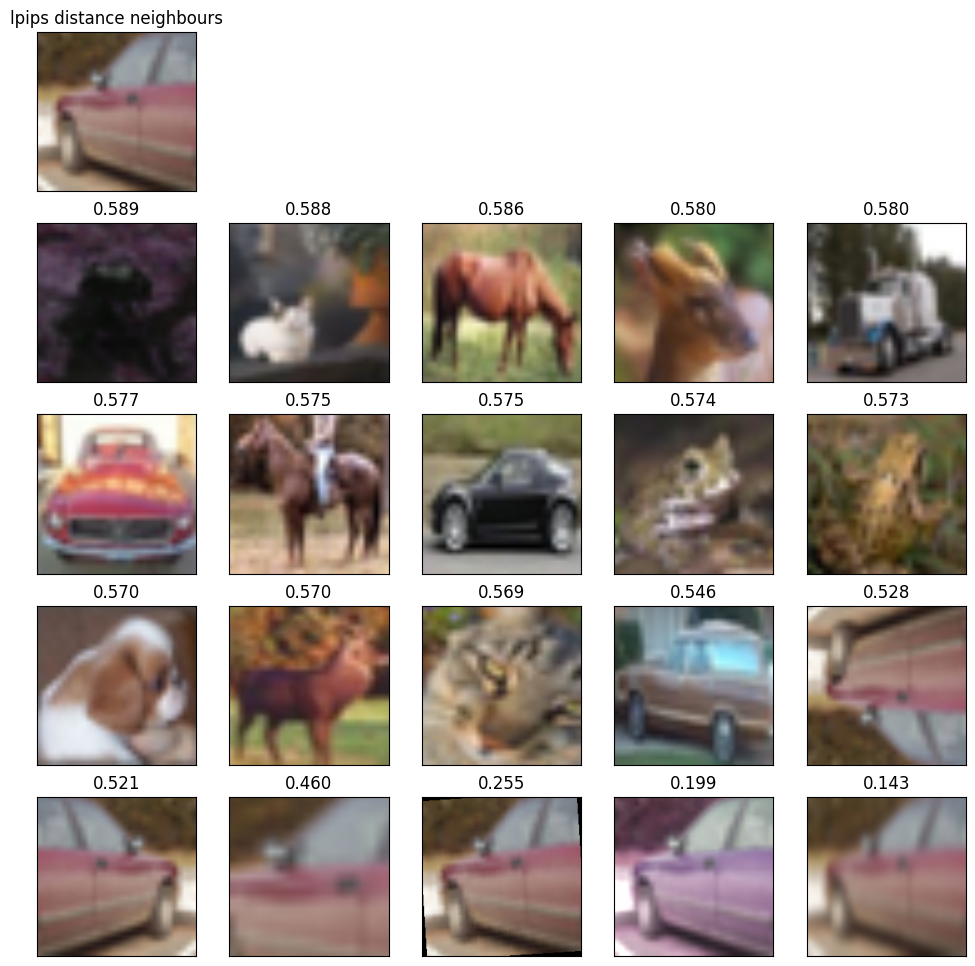

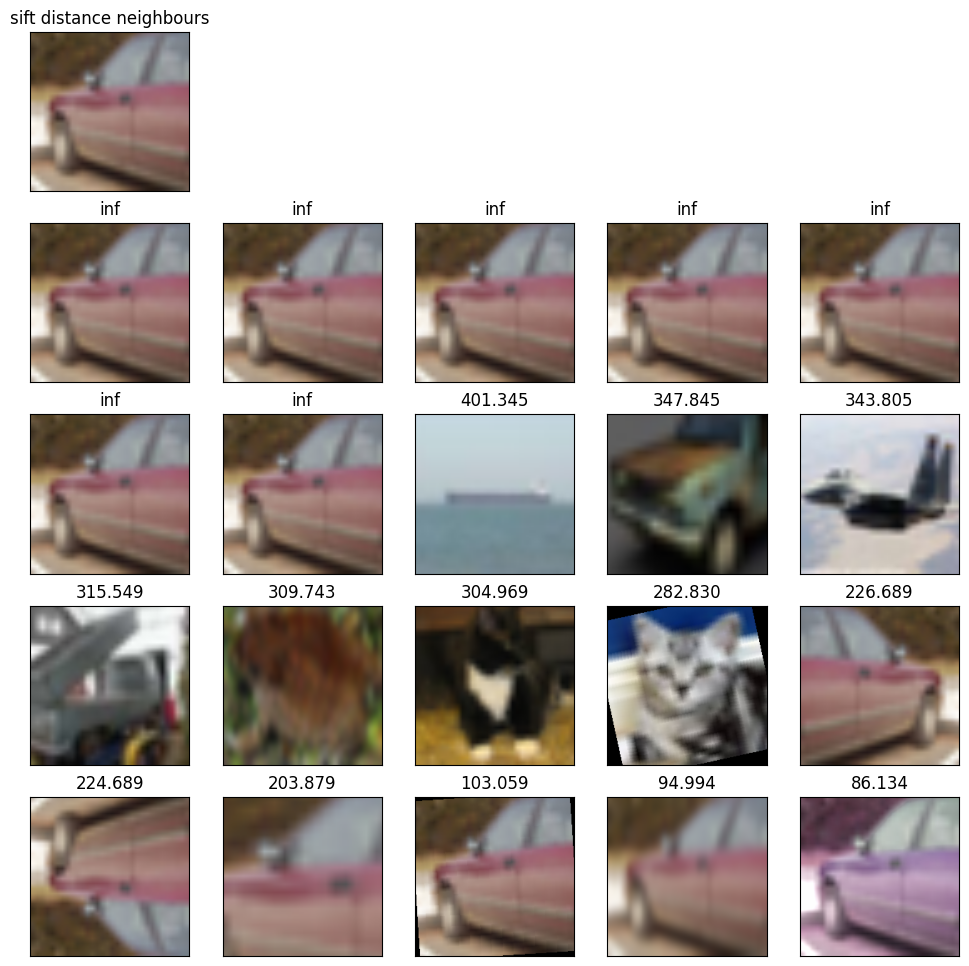

No SIFT features found in one or both images.


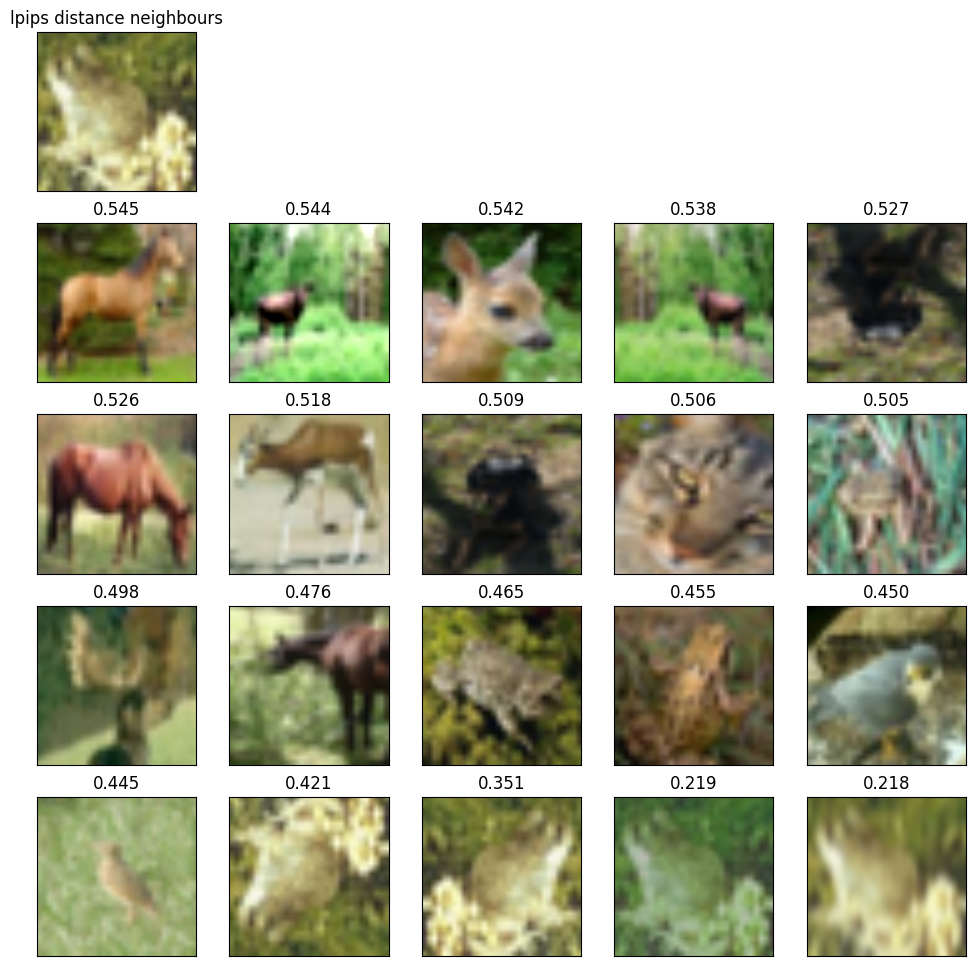

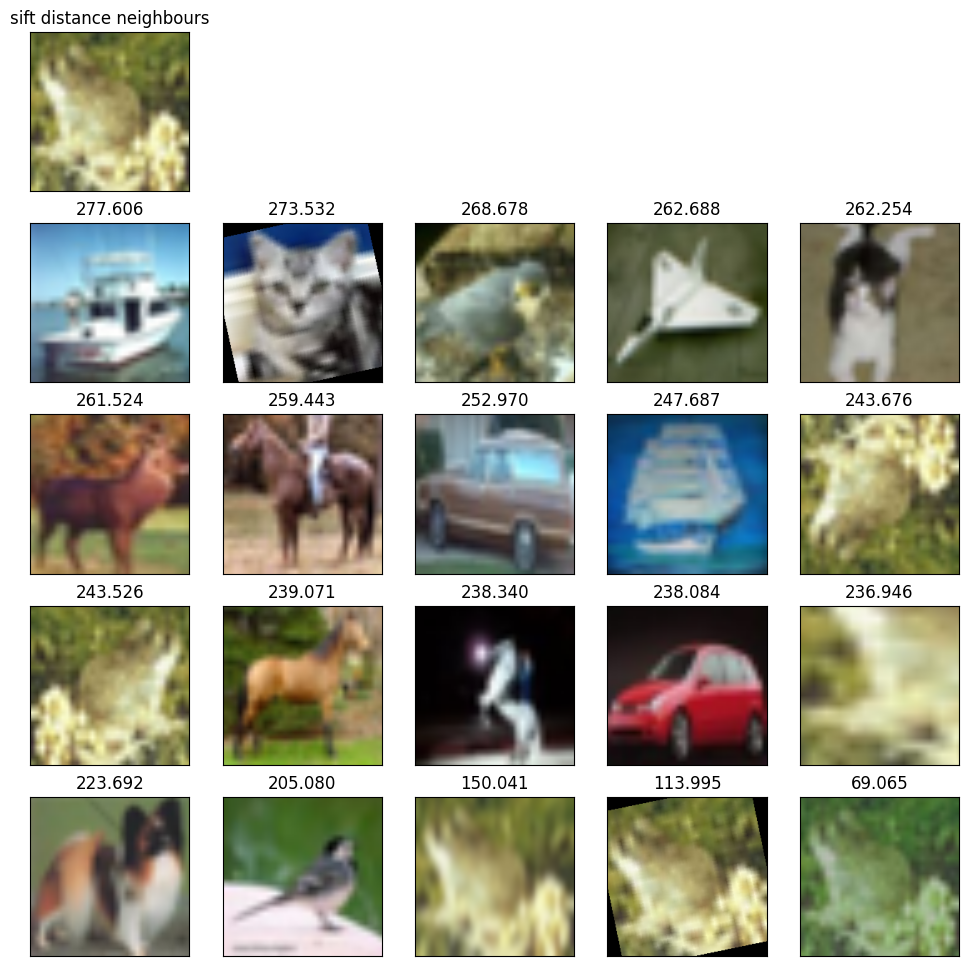

In [30]:
num_neigh = 20

for i,orig_img in enumerate(original_images):
    lpips_neigh,sift_neigh = get_neighbours(orig_img, num_neigh)
    show_plot(orig_img, lpips_neigh, num_neigh, i*2, "lpips distance neighbours")
    show_plot(orig_img, sift_neigh, num_neigh, i*2+1, "sift distance neighbours")
    